# Ejercicio A: Células en rosa

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 33.1/33.1 MB 52.2 MB/s eta 0:00:00


100%|██████████| 123k/123k [00:00<00:00, 2.08MiB/s]


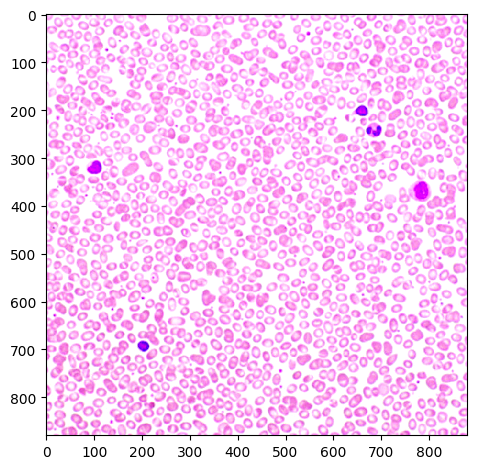

In [ ]:
### LECTURA DE LA IMAGEN

# Instalar las librerías necesarias
!pip install av onedrivedownloader pillow

# Importar librerías
from skimage import io
import av
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from onedrivedownloader import download

# Descargar imagen de OneDrive
PATH_FILE = 'https://universidadfv-my.sharepoint.com/:u:/g/personal/alberto_desantos_ufv_es/EW0GWd1MeIhDk6-KJS-igagBtyZQUVzLJ77OVCsyOkdCDA?e=busziB'
download(url=PATH_FILE, filename="circles.avif", unzip=False, force_download=True, clean=False)

# Leer doc AVIF usando PyAV
container = av.open('circles.avif')
frame = next(container.decode(video=0))

# Convertir imagen a un array de np
img_array = frame.to_ndarray(format='rgb24')

# Mostrar imagen
io.imshow(img_array)
io.show()

Text(0.5, 1.0, 'Histograma B')

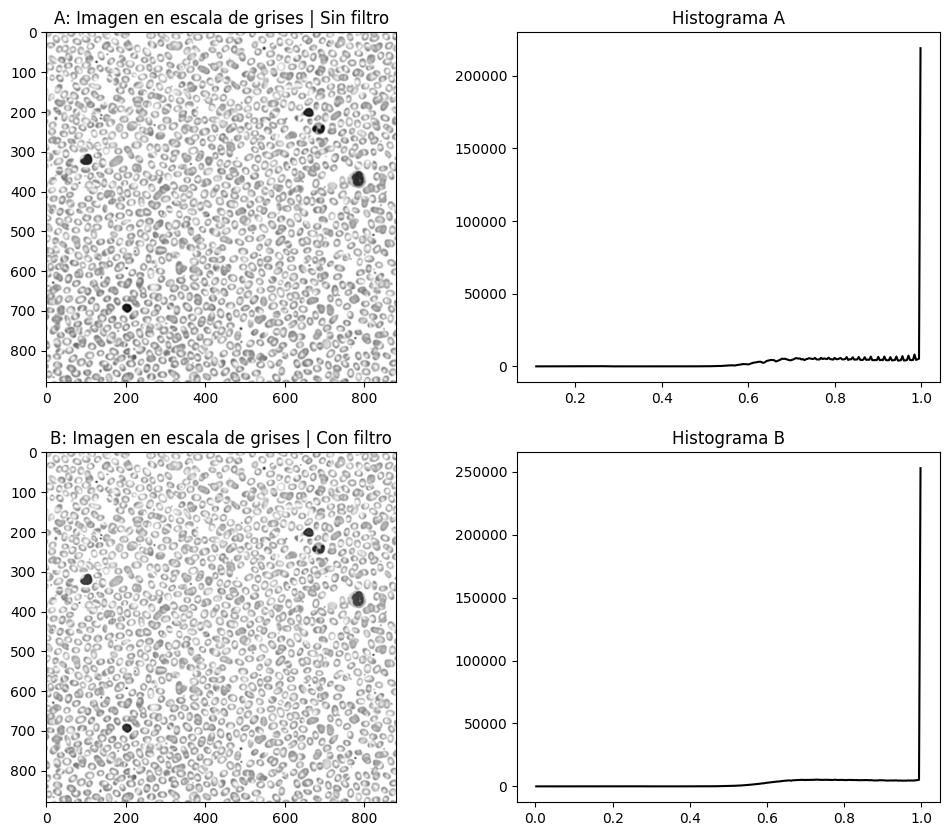

In [ ]:
### FILTRACIÓN ESPACIAL

import matplotlib.pyplot as plt
from skimage import io, color, filters, exposure
from skimage.filters import threshold_otsu, threshold_niblack, threshold_sauvola

# Convertir la imagen original a escala de grises
gray_image = color.rgb2gray(img_array)

# Calcular el histograma y mostrarlo (imagen en gris)
histA, binsA = exposure.histogram(gray_image)

# Aplica el filtro de sharpening
from skimage.filters import unsharp_mask
sharpened_image = unsharp_mask(gray_image, radius=1, amount=1)

# Calcular el histograma y mostrarlo (imagen en gris)
histB, binsB = exposure.histogram(sharpened_image)

# Crear un subplot con 1 fila y 2 columnas
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

axes[0,0].imshow(gray_image, cmap="gray")
axes[0,0].set_title("A: Imagen en escala de grises | Sin filtro")

axes[0,1].plot(binsA, histA, color="black")
axes[0,1].set_title("Histograma A")

axes[1,0].imshow(sharpened_image, cmap="gray")
axes[1,0].set_title("B: Imagen en escala de grises | Con filtro")

axes[1,1].plot(binsB, histB, color="black")
axes[1,1].set_title("Histograma B")

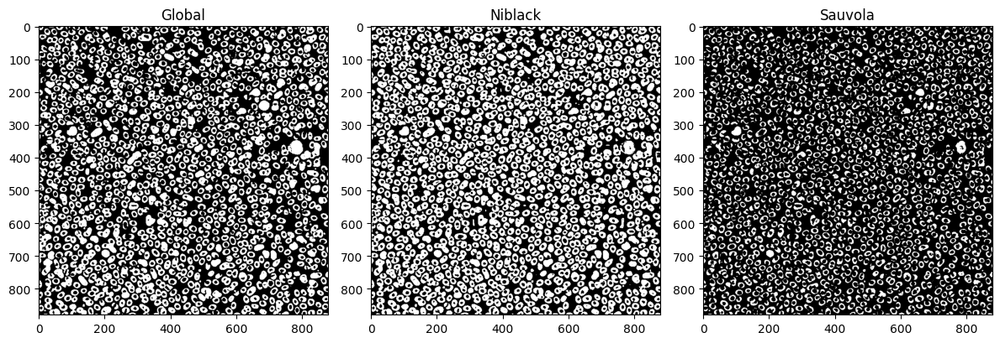

In [ ]:
### UMBRALIZACIÓN

import matplotlib.pyplot as plt
from skimage.filters import threshold_otsu, threshold_niblack, threshold_sauvola

# Probamos umbralización global
thresh_global = threshold_otsu(sharpened_image)
binary_global = sharpened_image < thresh_global

# Probamos con umbralización adaptativa Niblack
window_size = 25  # Tamaño de la ventana para la umbralización local
k = -0.2  # Parámetro k para el método Niblack
thresh_niblack = threshold_niblack(sharpened_image, window_size=window_size, k=k)
binary_niblack = sharpened_image < thresh_niblack

# Probamos con la umbralización adaptativa Sauvola
window_size = 25  # Tamaño de la ventana para la umbralización local
k = 0.15  # Parámetro k para el método Sauvola
thresh_sauvola = threshold_sauvola(sharpened_image, window_size=window_size, k=k)
binary_sauvola = sharpened_image < thresh_sauvola

# Mostramos y comparamos el efecto de las distintas umralizaciones
fig, axes = plt.subplots(1, 3, figsize=(12, 5))
umbralizaciones = {1: [binary_global, "Global"],
                   2: [binary_niblack, "Niblack"],
                   3: [binary_sauvola, "Sauvola"]}
for i in umbralizaciones:
    axes[i-1].imshow(umbralizaciones[i][0], cmap="gray")
    axes[i-1].set_title(f"{umbralizaciones[i][1]}")
plt.tight_layout()
plt.show()

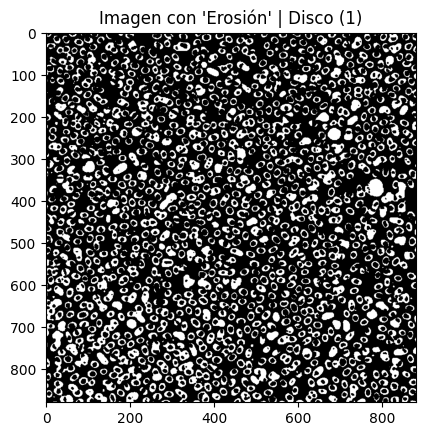

In [ ]:
### MORFOLOGÍA MATEMÁTICA

# Paquetes necesarios para la morfología matemática
from skimage.morphology import erosion, dilation, opening, closing
# Elementos estructurales
from skimage.morphology import disk, diamond, ball, rectangle
from skimage import measure

# Consideramos que la mejor opción es hacer una erosión
erosion_nb = erosion(binary_global, disk(1))

# Mostrar la imagen binarizada con Niblack
import matplotlib.pyplot as plt
plt.imshow(erosion_nb, cmap="gray")
plt.title("Imagen con 'Erosión' | Disco (1)")
plt.show()

In [ ]:
### CONTEO

# Etiquetar los blobs
labels_image = measure.label(erosion_nb, connectivity=2)

# Contar el número de blobs (excluyendo el fondo etiquetado como 0)
num_blobs = labels_image.max()

print(f'Número de blobs detectados: {num_blobs}')

Número de blobs detectados: 1411


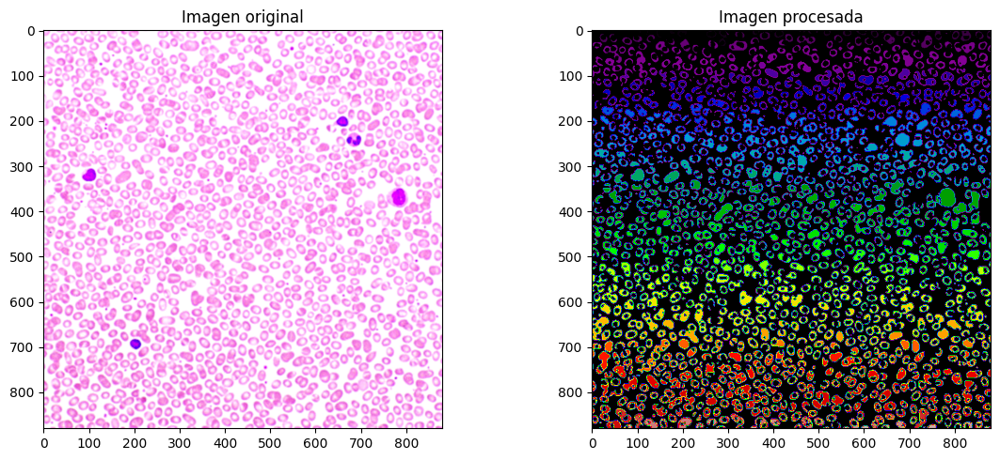

" ACTIVAR SOLO SI SE DESEA DESCARGAR LA FIGURA\n# Descargar la figura guardada\nfrom google.colab import files\nfiles.download('/content/ResultadosA.png')\n"

In [ ]:
### IMAGEN RESULTADO

# Mostrar la imagen etiquetada y el número de blobs
fig, ax = plt.subplots(1, 2, figsize=(12, 5))
cuenta = {1: [img_array, "gray", "Imagen original"],
          2: [labels_image, "nipy_spectral", "Imagen procesada"]}
for i in cuenta:
    ax[i-1].imshow(cuenta[i][0], cmap=cuenta[i][1])
    ax[i-1].set_title(f"{cuenta[i][2]}")
plt.tight_layout()

# Guardar la imagen antes de mostrarla por pantalla
plt.savefig('/content/ResultadosA.png')

# Mostrar imagen
plt.show()

"""
ACTIVAR SOLO SI SE DESEA DESCARGAR LA FIGURA
# Descargar la figura guardada
from google.colab import files
files.download('/content/ResultadosA.png')
"""

# Ejercicio B: Líneas amarillas

100%|██████████| 144k/144k [00:00<00:00, 819kiB/s] 


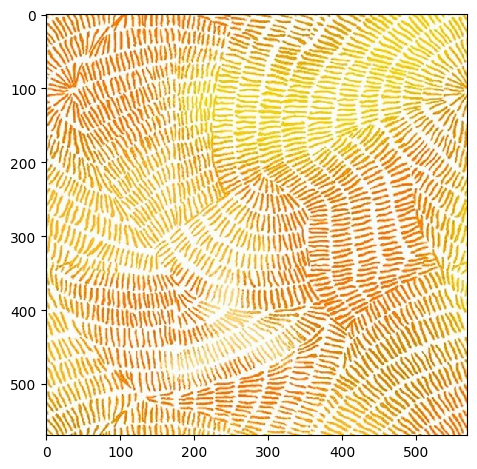

In [ ]:
### LECTURA DE LA IMAGEN

# Comenzamos descargando la imagen
!pip install onedrivedownloader
from onedrivedownloader import download

PATH_FILE = 'https://universidadfv-my.sharepoint.com/:i:/g/personal/alberto_desantos_ufv_es/EXwHI7sqSp5FjQmihEs5dm4BPRKr5RvJspsSKUVFbMJvlg?e=Fs9gNg'
download(url=PATH_FILE, filename="image.jpg", unzip=False, force_download=True, clean=False)

# Leemos la imagen
from skimage import io
image = io.imread('image.jpg')

# Mostramos la imagen
io.imshow(image)

Text(0.5, 1.0, 'Histograma B')

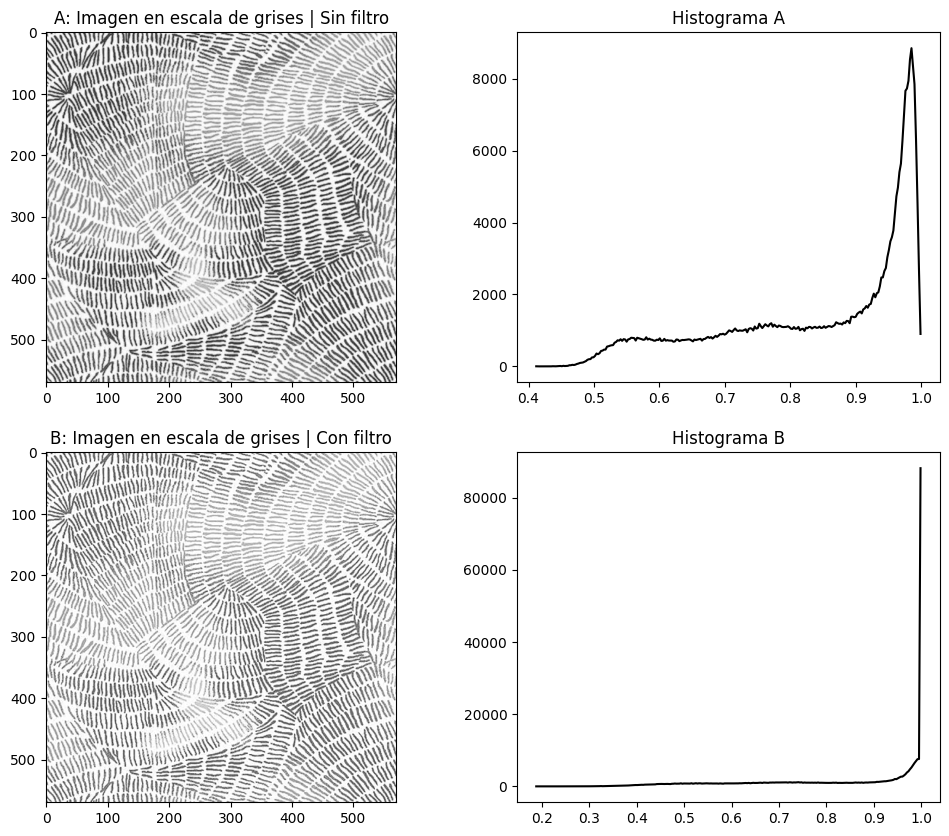

In [ ]:
### FILTRACIÓN ESPACIAL

import matplotlib.pyplot as plt
from skimage import io, color, filters, exposure
from skimage.filters import threshold_otsu, threshold_niblack, threshold_sauvola

# Convertir la imagen original a escala de grises
gray_image = color.rgb2gray(image)

# Calcular el histograma y mostrarlo (imagen en gris)
histA, binsA = exposure.histogram(gray_image)

# Aplica el filtro de sharpening
from skimage.filters import unsharp_mask
sharpened_image = unsharp_mask(gray_image, radius=1, amount=1)

# Calcular el histograma y mostrarlo (imagen en gris)
histB, binsB = exposure.histogram(sharpened_image)

# Crear un subplot con 1 fila y 2 columnas
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

axes[0,0].imshow(gray_image, cmap="gray")
axes[0,0].set_title("A: Imagen en escala de grises | Sin filtro")

axes[0,1].plot(binsA, histA, color="black")
axes[0,1].set_title("Histograma A")

axes[1,0].imshow(sharpened_image, cmap="gray")
axes[1,0].set_title("B: Imagen en escala de grises | Con filtro")

axes[1,1].plot(binsB, histB, color="black")
axes[1,1].set_title("Histograma B")

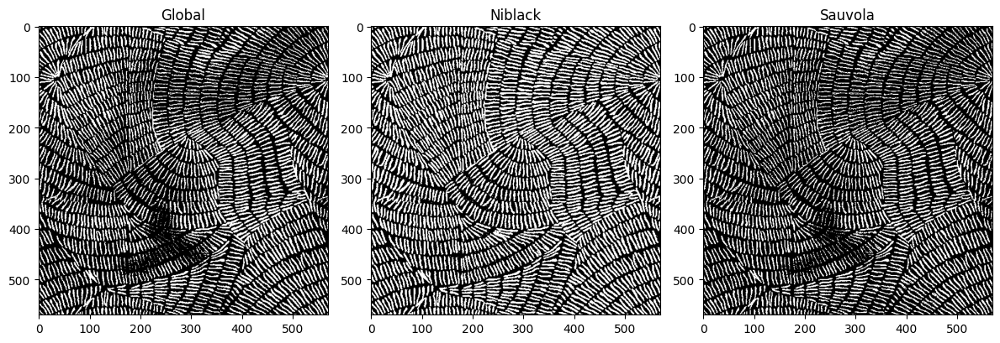

In [ ]:
### UMBRALIZACIÓN

import matplotlib.pyplot as plt
from skimage.filters import threshold_otsu, threshold_niblack, threshold_sauvola

# Probamos umbralización global
thresh_global = threshold_otsu(sharpened_image)
binary_global = sharpened_image < thresh_global

# Probamos con umbralización adaptativa Niblack
window_size = 25  # Tamaño de la ventana para la umbralización local
k = -0.2  # Parámetro k para el método Niblack
thresh_niblack = threshold_niblack(sharpened_image, window_size=window_size, k=k)
binary_niblack = sharpened_image < thresh_niblack

# Probamos con la umbralización adaptativa Sauvola
window_size = 25  # Tamaño de la ventana para la umbralización local
k = 0.15  # Parámetro k para el método Sauvola
thresh_sauvola = threshold_sauvola(sharpened_image, window_size=window_size, k=k)
binary_sauvola = sharpened_image < thresh_sauvola

# Mostramos y comparamos el efecto de las distintas umralizaciones
fig, axes = plt.subplots(1, 3, figsize=(12, 5))
umbralizaciones = {1: [binary_global, "Global"],
                   2: [binary_niblack, "Niblack"],
                   3: [binary_sauvola, "Sauvola"]}
for i in umbralizaciones:
    axes[i-1].imshow(umbralizaciones[i][0], cmap="gray")
    axes[i-1].set_title(f"{umbralizaciones[i][1]}")
plt.tight_layout()
plt.show()

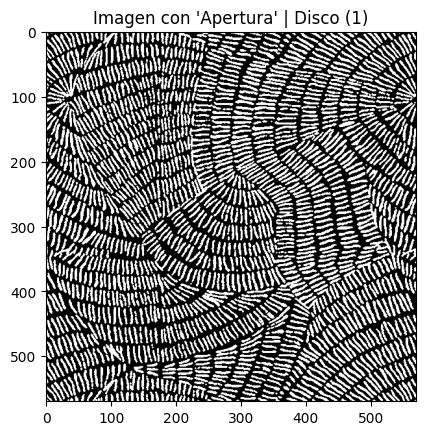

In [ ]:
### MORFOLOGÍA MATEMÁTICA

# La mejor umbralización es la Niblack

# Paquetes necesarios para la morfología matemática
from skimage.morphology import erosion, dilation, opening, closing
# Elementos estructurales
from skimage.morphology import disk, diamond, ball, rectangle
from skimage import measure

# Consideramos que la mejor opción es hacer una apertura
opened_image = opening(binary_niblack, disk(1))

# Mostrar la imagen binarizada con Niblack
import matplotlib.pyplot as plt
plt.imshow(opened_image, cmap="gray")
plt.title("Imagen con 'Apertura' | Disco (1)")
plt.show()

In [ ]:
### CONTEO

# Etiquetar los blobs
labels_image = measure.label(opened_image, connectivity=2)

# Contar el número de blobs (excluyendo el fondo etiquetado como 0)
num_blobs = labels_image.max()

print(f'Número de blobs detectados: {num_blobs}')

Número de blobs detectados: 1558


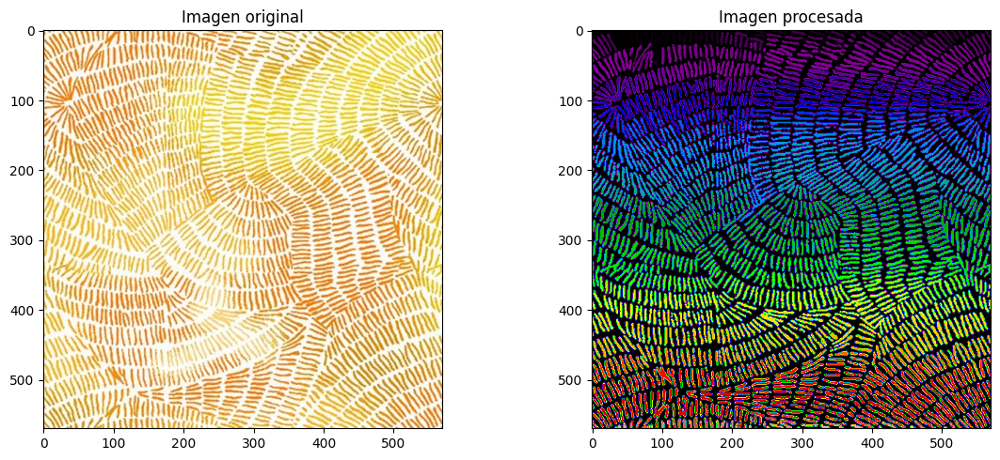

" ACTIVAR SOLO SI SE DESEA DESCARGAR LA FIGURA\n# Descargar la figura guardada\nfrom google.colab import files\nfiles.download('/content/ResultadosB.png')\n"

In [ ]:
### IMAGEN RESULTADO

# Mostrar la imagen etiquetada y el número de blobs
fig, ax = plt.subplots(1, 2, figsize=(12, 5))
cuenta = {1: [image, "gray", "Imagen original"],
          2: [labels_image, "nipy_spectral", "Imagen procesada"]}
for i in cuenta:
    ax[i-1].imshow(cuenta[i][0], cmap=cuenta[i][1])
    ax[i-1].set_title(f"{cuenta[i][2]}")
plt.tight_layout()

# Guardar la imagen antes de mostrarla por pantalla
plt.savefig('/content/ResultadosB.png')

# Mostrar imagen
plt.show()

"""
ACTIVAR SOLO SI SE DESEA DESCARGAR LA FIGURA
# Descargar la figura guardada
from google.colab import files
files.download('/content/ResultadosB.png')
"""


# Validación ejercicio A

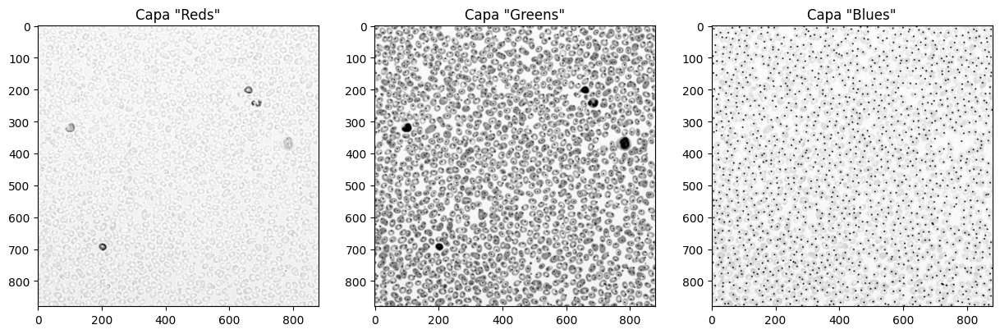

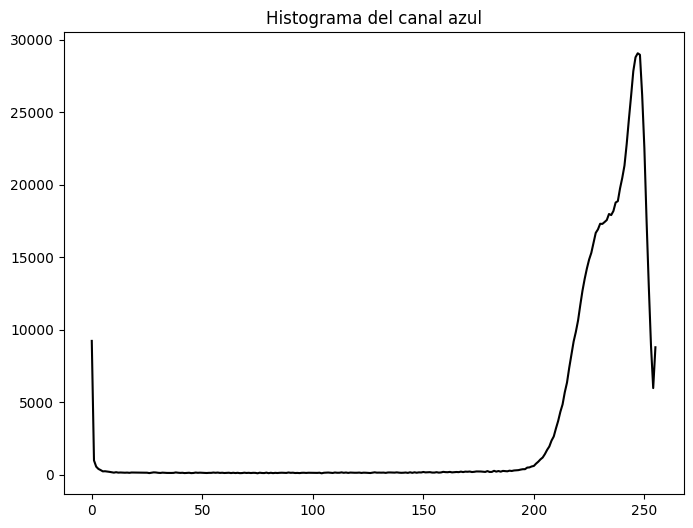

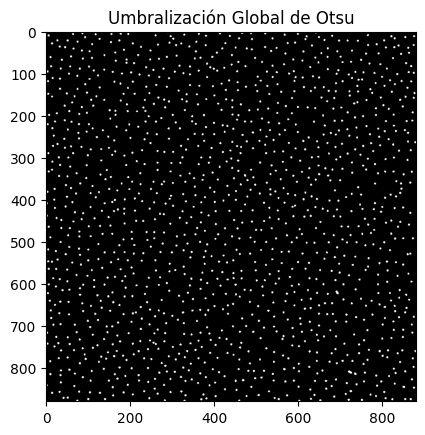

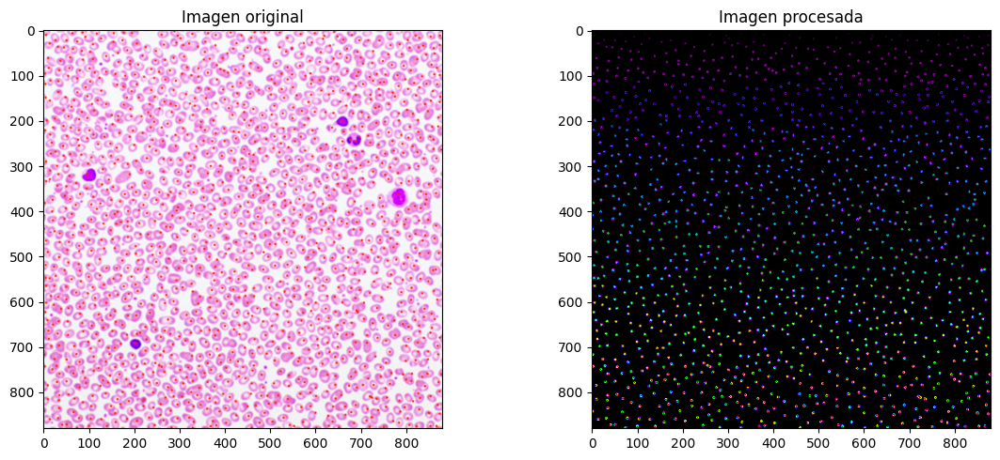

Número de blobs detectados: 1414


In [ ]:
"""
EJECUTAR ESTE CÓDIGO DESPUÉS DE SUBIR A LA CARPETA DE GOOGLE COLAB EL ARCHIVO circles validation.tiff
"""

import matplotlib.pyplot as plt
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color, filters, exposure, measure
from skimage.filters import threshold_otsu, threshold_local, threshold_niblack, threshold_sauvola, gaussian

# LECTURA IMAGEN
image = io.imread('/content/circles validation.tiff')

# CAPAS RGB
# Separamos la imagen por capas R, G, B
red_channel = image[:, :, 0]    # Capa roja
green_channel = image[:, :, 1]  # Capa verde
blue_channel = image[:, :, 2]   # Capa azul
my_dict = {1 : [red_channel ,"Reds"],
           2 : [green_channel, "Greens"],
           3 : [blue_channel, "Blues"]}
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
for i in my_dict:
  axes[i-1].imshow(my_dict[i][0], cmap="gray")
  axes[i-1].set_title(f'Capa "{my_dict[i][1]}"')

# HISTOGRAMA
hist, bins = exposure.histogram(blue_channel)
plt.figure(figsize=(8, 6))
plt.plot(bins, hist, color='black')  # Use plot for a line graph
plt.title('Histograma del canal azul')
plt.show()

# UMBRALIZACIÓN
# Probamos umbralización global
thresh_global = threshold_otsu(blue_channel)
binary_global = blue_channel < thresh_global
plt.imshow(binary_global, cmap='gray')
plt.title('Umbralización Global de Otsu')
plt.show()

# CONTEO
# Etiquetar los blobs
labels_image = measure.label(binary_global, connectivity=2)
# Contar el número de blobs (excluyendo el fondo etiquetado como 0)
num_blobs = labels_image.max()
# Mostrar la imagen etiquetada y el número de blobs
fig, ax = plt.subplots(1, 2, figsize=(12, 5))
cuenta = {1: [image, "gray", "Imagen original"],
          2: [labels_image, "nipy_spectral", "Imagen procesada"]}
for i in cuenta:
    ax[i-1].imshow(cuenta[i][0], cmap=cuenta[i][1])
    ax[i-1].set_title(f"{cuenta[i][2]}")
plt.tight_layout()
plt.show()
print(f'Número de blobs detectados: {num_blobs}')

# Validación ejercicio B

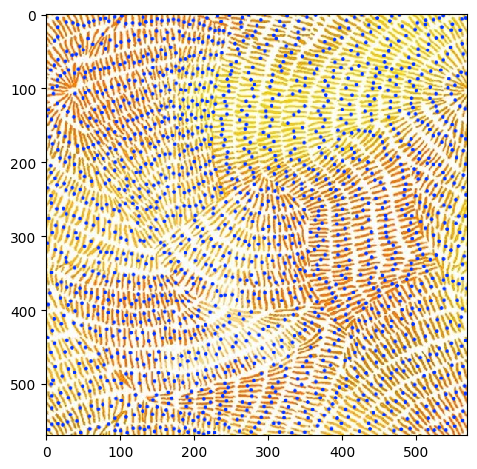

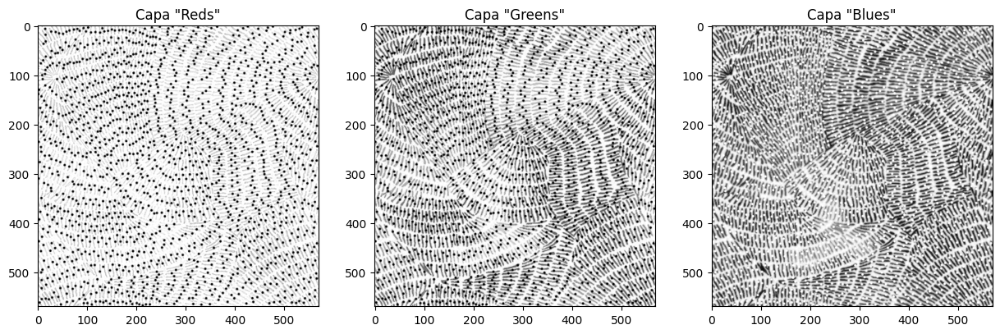

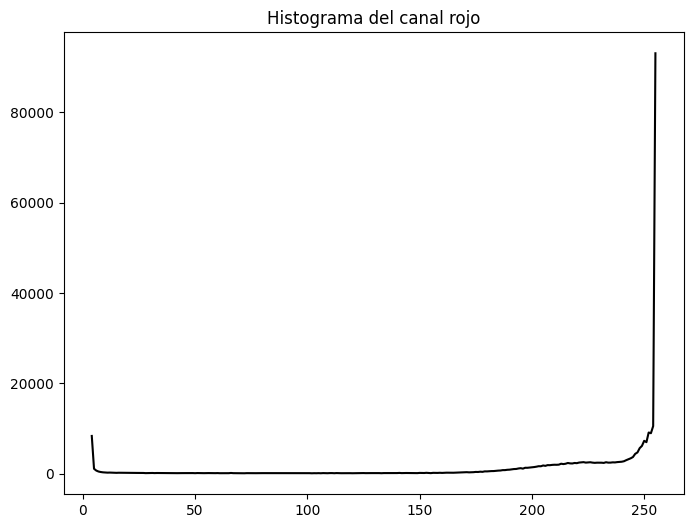

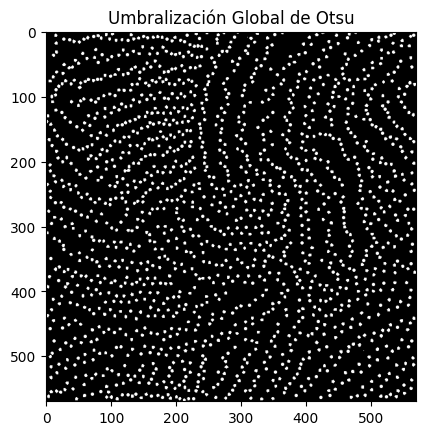

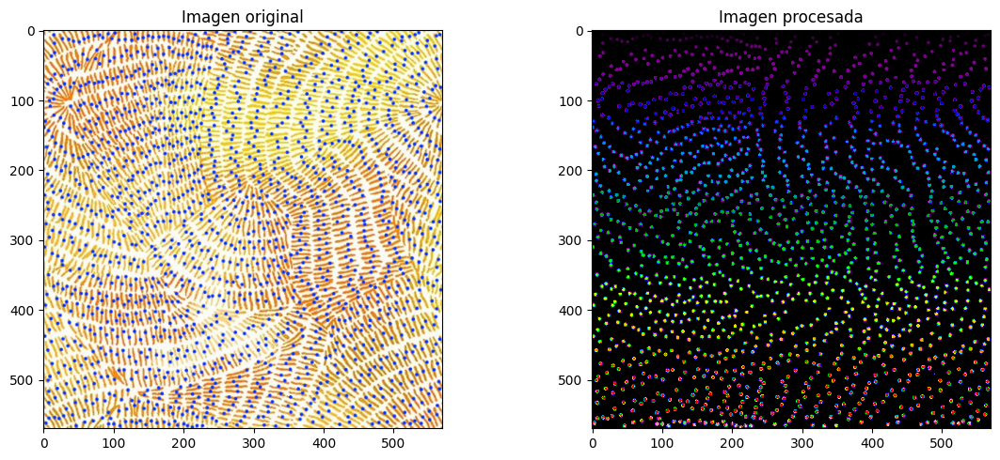

Número de blobs detectados: 1607


In [ ]:
"""
EJECUTAR ESTE CÓDIGO DESPUÉS DE SUBIR A LA CARPETA DE GOOGLE COLAB EL ARCHIVO lineas validation.tiff
"""

import matplotlib.pyplot as plt
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color, filters, exposure, measure
from skimage.filters import threshold_otsu, threshold_local, threshold_niblack, threshold_sauvola, gaussian

# LECTURA IMAGEN
image = io.imread('/content/lineas validation.tiff')
io.imshow(image)

# CAPAS RGB
# Separamos la imagen por capas R, G, B
red_channel = image[:, :, 0]    # Capa roja
green_channel = image[:, :, 1]  # Capa verde
blue_channel = image[:, :, 2]   # Capa azul
my_dict = {1 : [red_channel ,"Reds"],
           2 : [green_channel, "Greens"],
           3 : [blue_channel, "Blues"]}
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
for i in my_dict:
  axes[i-1].imshow(my_dict[i][0], cmap="gray")
  axes[i-1].set_title(f'Capa "{my_dict[i][1]}"')

# HISTOGRAMA
hist, bins = exposure.histogram(red_channel)
plt.figure(figsize=(8, 6))
plt.plot(bins, hist, color='black')  # Use plot for a line graph
plt.title('Histograma del canal rojo')
plt.show()

# UMBRALIZACIÓN
# Probamos umbralización global
thresh_global = threshold_otsu(red_channel)
binary_global = red_channel < thresh_global
plt.imshow(binary_global, cmap='gray')
plt.title('Umbralización Global de Otsu')
plt.show()

# CONTEO
# Etiquetar los blobs
labels_image = measure.label(binary_global, connectivity=2)
# Contar el número de blobs (excluyendo el fondo etiquetado como 0)
num_blobs = labels_image.max()
# Mostrar la imagen etiquetada y el número de blobs
fig, ax = plt.subplots(1, 2, figsize=(12, 5))
cuenta = {1: [image, "gray", "Imagen original"],
          2: [labels_image, "nipy_spectral", "Imagen procesada"]}
for i in cuenta:
    ax[i-1].imshow(cuenta[i][0], cmap=cuenta[i][1])
    ax[i-1].set_title(f"{cuenta[i][2]}")
plt.tight_layout()
plt.show()
print(f'Número de blobs detectados: {num_blobs}')